## Import dependencies


In [2]:
import cv2
import numpy as np  #numpy 1.24.3
import os
from matplotlib import pyplot as plt  # matplotlib 3.8.0
import time
import mediapipe as mp # mediapipe 0.10.7
import tensorflow as tf # tensorflow 2.13.0

In [3]:
pip list

Package                       Version
----------------------------- ---------------
absl-py                       1.4.0
aiobotocore                   2.5.0
aiofiles                      22.1.0
aiohttp                       3.8.5
aioitertools                  0.7.1
aiosignal                     1.2.0
aiosqlite                     0.18.0
alabaster                     0.7.12
ale-py                        0.8.1
anaconda-anon-usage           0.4.3
anaconda-catalogs             0.2.0
anaconda-client               1.11.3
anaconda-cloud-auth           0.1.4
anaconda-navigator            2.5.0
anaconda-project              0.11.1
anyio                         3.5.0
appdirs                       1.4.4
archspec                      0.2.1
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.3
astroid                       2.14.2
astropy                       5.3.4
asttokens                     2.0.5
astunparse                    1.6.3
async-ti

In [1]:
from platform import python_version

print(python_version())

3.11.5


In [4]:
opencv_version = cv2.__version__

# Print the version
print("OpenCV version:", opencv_version)

OpenCV version: 4.8.1


## Keypoints using MP holistic

In [22]:
mp_holistic = mp.solutions.holistic # Holistic model
mp_drawing = mp.solutions.drawing_utils # Drawing utilities

In [23]:
def mediapipe_detection(image, model):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # COLOR CONVERSION BGR 2 RGB
    image.flags.writeable = False                  # Image is no longer writeable
    results = model.process(image)                 # Make prediction
    image.flags.writeable = True                   # Image is now writeable 
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # COLOR COVERSION RGB 2 BGR
    return image, results 

In [24]:
def draw_styled_landmarks(image, results):
    # Draw face connections
    mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACEMESH_CONTOURS, 
                             mp_drawing.DrawingSpec(color=(80,110,10), thickness=1, circle_radius=1), 
                             mp_drawing.DrawingSpec(color=(80,256,121), thickness=1, circle_radius=1)
                             ) 
    # Draw pose connections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS,
                             mp_drawing.DrawingSpec(color=(80,22,10), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(80,44,121), thickness=2, circle_radius=2)
                             ) 
    # Draw left hand connections
    mp_drawing.draw_landmarks(image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS, 
                             mp_drawing.DrawingSpec(color=(121,22,76), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(121,44,250), thickness=2, circle_radius=2)
                             ) 
    # Draw right hand connections  
    mp_drawing.draw_landmarks(image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS, 
                             mp_drawing.DrawingSpec(color=(245,117,66), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(245,66,230), thickness=2, circle_radius=2)
                             ) 

In [59]:
cap = cv2.VideoCapture(0)
# access media pipe model
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    while cap.isOpened():

        #read feed
        ret, frame = cap.read()

        #make detections
        image, results = mediapipe_detection(frame, holistic)
        print(results)
        
        #draw landmarks
        draw_styled_landmarks(image, results)

        #show to user
        cv2.imshow('OpenCV Feed', image)

        #break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    cap.release()
    cv2.destroyAllWindows()

<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.soluti

<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.soluti

<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.soluti

<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.soluti

<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.soluti

<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.soluti

<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.soluti

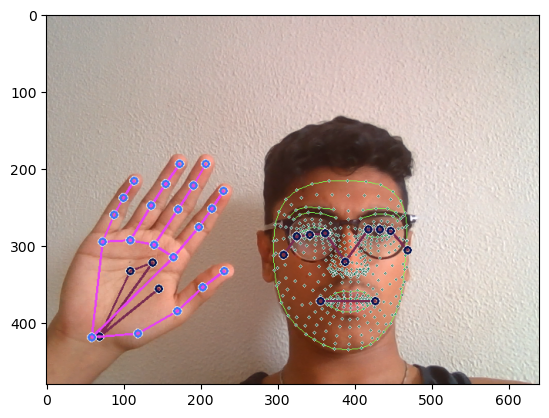

In [35]:
image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)  #so open cv takes feed in RGB
plt.imshow(image)

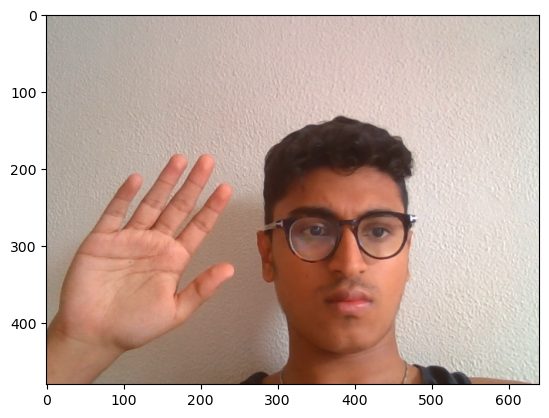

In [40]:
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
plt.imshow(frame)

In [13]:
len(results.face_landmarks.landmark)


468

In [14]:
results.face_landmarks.landmark

[x: 0.67222446
y: 0.79743946
z: -0.034842715
, x: 0.6731134
y: 0.73834276
z: -0.06552954
, x: 0.6710103
y: 0.756345
z: -0.03388507
, x: 0.66015327
y: 0.67540693
z: -0.050485823
, x: 0.6732765
y: 0.7191221
z: -0.06982728
, x: 0.67225486
y: 0.6936983
z: -0.065111965
, x: 0.6689387
y: 0.6333479
z: -0.032436706
, x: 0.5734816
y: 0.6259216
z: 0.0077327634
, x: 0.6679461
y: 0.5923814
z: -0.025296625
, x: 0.66828096
y: 0.56844354
z: -0.028365988
, x: 0.6671608
y: 0.48086214
z: -0.015697313
, x: 0.67227805
y: 0.8062151
z: -0.03314115
, x: 0.6718793
y: 0.81249785
z: -0.028898958
, x: 0.6712574
y: 0.81463504
z: -0.023332467
, x: 0.67182386
y: 0.8201356
z: -0.022360567
, x: 0.67217934
y: 0.8275776
z: -0.024362795
, x: 0.6723263
y: 0.83727306
z: -0.026683621
, x: 0.6720968
y: 0.847864
z: -0.024382945
, x: 0.6703412
y: 0.8680686
z: -0.011646853
, x: 0.6724301
y: 0.7478453
z: -0.059208546
, x: 0.659703
y: 0.74563295
z: -0.043232143
, x: 0.5209246
y: 0.5595739
z: 0.06051183
, x: 0.61146605
y: 0.64337

In [15]:
len(results.right_hand_landmarks.landmark)


21

In [16]:
len(results.left_hand_landmarks.landmark) #since there was no left hand in the above image

AttributeError: 'NoneType' object has no attribute 'landmark'

In [41]:
frame

array([[[162, 158, 152],
        [169, 165, 160],
        [164, 160, 156],
        ...,
        [199, 196, 194],
        [200, 198, 196],
        [201, 199, 197]],

       [[168, 164, 160],
        [169, 165, 161],
        [169, 165, 161],
        ...,
        [200, 198, 193],
        [199, 197, 193],
        [202, 200, 196]],

       [[165, 161, 158],
        [167, 161, 158],
        [173, 166, 163],
        ...,
        [202, 200, 197],
        [194, 192, 190],
        [196, 194, 192]],

       ...,

       [[176, 124,  97],
        [176, 124,  97],
        [176, 124,  97],
        ...,
        [208, 211, 203],
        [205, 206, 199],
        [210, 210, 203]],

       [[176, 126,  99],
        [176, 125,  98],
        [176, 124,  97],
        ...,
        [198, 200, 194],
        [198, 199, 192],
        [206, 207, 200]],

       [[176, 126,  99],
        [176, 125,  99],
        [176, 123,  99],
        ...,
        [194, 196, 192],
        [184, 184, 180],
        [206, 206, 202]]

In [42]:
draw_styled_landmarks(frame, results)

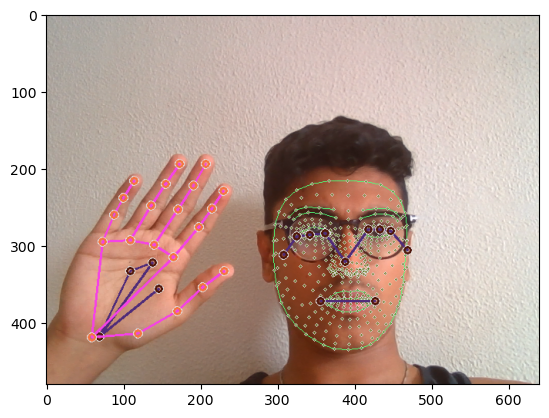

In [45]:
plt.imshow(frame)

## Extarct key points

In [47]:
results.pose_landmarks.landmark # [0].x or .y or .z

[x: 0.60631216
y: 0.6706207
z: -1.6032498
visibility: 0.9983064
, x: 0.6544732
y: 0.5826362
z: -1.4861572
visibility: 0.99832207
, x: 0.6775554
y: 0.5829448
z: -1.4864244
visibility: 0.99785787
, x: 0.69927484
y: 0.58593297
z: -1.4861476
visibility: 0.99744725
, x: 0.566592
y: 0.59338844
z: -1.4728773
visibility: 0.9988858
, x: 0.5354477
y: 0.5975152
z: -1.473131
visibility: 0.99895716
, x: 0.50912994
y: 0.60142875
z: -1.4741032
visibility: 0.9992126
, x: 0.7334717
y: 0.6378809
z: -0.82341623
visibility: 0.99712193
, x: 0.482277
y: 0.6501284
z: -0.7489929
visibility: 0.99947214
, x: 0.66750157
y: 0.7760775
z: -1.3593619
visibility: 0.99575716
, x: 0.5569869
y: 0.776885
z: -1.3416946
visibility: 0.9982637
, x: 0.90606034
y: 1.0707706
z: -0.6402544
visibility: 0.73018813
, x: 0.3153562
y: 1.0624293
z: -0.4590165
visibility: 0.9704687
, x: 1.0164311
y: 1.519552
z: -1.8705437
visibility: 0.26568305
, x: -0.10039307
y: 1.3398184
z: -1.7859774
visibility: 0.9048383
, x: 0.81229556
y: 1.22685

In [5]:
pose = []
for res in results.pose_landmarks.landmark:
    test = np.array([res.x, res.y, res.z, res.visibility])
    pose.append(test)
    

NameError: name 'results' is not defined

In [13]:
pose

[array([ 0.62411457,  0.51639467, -0.92751205,  0.99976802]),
 array([ 0.64736843,  0.4495022 , -0.83747208,  0.99958199]),
 array([ 0.66509223,  0.45169035, -0.83763969,  0.9994427 ]),
 array([ 0.68305486,  0.45480472, -0.83758336,  0.99948543]),
 array([ 0.58479619,  0.45134154, -0.82526761,  0.99966019]),
 array([ 0.56144297,  0.45500603, -0.8244468 ,  0.9996438 ]),
 array([ 0.54077721,  0.45945218, -0.82480633,  0.99977815]),
 array([ 0.70437264,  0.50314403, -0.40007052,  0.99940026]),
 array([ 0.5074501 ,  0.51612866, -0.31970537,  0.99974865]),
 array([ 0.66254026,  0.60060477, -0.77944499,  0.99950594]),
 array([ 0.58318198,  0.61102521, -0.75930822,  0.99969298]),
 array([ 0.87210596,  0.89532578, -0.24569568,  0.9851827 ]),
 array([ 0.3440308 ,  0.90989101, -0.18921846,  0.99826413]),
 array([ 1.02717412,  1.38088357, -0.43473426,  0.05505714]),
 array([ 0.01018956,  1.27439511, -0.92263585,  0.95234132]),
 array([ 1.06794858,  1.58588135, -0.79141283,  0.06939657]),
 array([

In [14]:
len(results.pose_landmarks.landmark)

33

In [15]:
len(pose)

33

In [6]:
pose = np.array([[res.x, res.y, res.z, res.visibility] for res in results.pose_landmarks.landmark]).flatten() 

NameError: name 'results' is not defined

In [17]:
len(pose)

132

In [18]:
pose

array([ 6.24114573e-01,  5.16394675e-01, -9.27512050e-01,  9.99768019e-01,
        6.47368431e-01,  4.49502200e-01, -8.37472081e-01,  9.99581993e-01,
        6.65092230e-01,  4.51690346e-01, -8.37639689e-01,  9.99442697e-01,
        6.83054864e-01,  4.54804718e-01, -8.37583363e-01,  9.99485433e-01,
        5.84796190e-01,  4.51341540e-01, -8.25267613e-01,  9.99660194e-01,
        5.61442971e-01,  4.55006033e-01, -8.24446797e-01,  9.99643803e-01,
        5.40777206e-01,  4.59452182e-01, -8.24806333e-01,  9.99778152e-01,
        7.04372644e-01,  5.03144026e-01, -4.00070518e-01,  9.99400258e-01,
        5.07450104e-01,  5.16128659e-01, -3.19705367e-01,  9.99748647e-01,
        6.62540257e-01,  6.00604773e-01, -7.79444993e-01,  9.99505937e-01,
        5.83181977e-01,  6.11025214e-01, -7.59308219e-01,  9.99692976e-01,
        8.72105956e-01,  8.95325780e-01, -2.45695680e-01,  9.85182703e-01,
        3.44030797e-01,  9.09891009e-01, -1.89218462e-01,  9.98264134e-01,
        1.02717412e+00,  

In [19]:
pose.shape

(132,)

In [20]:
len(results.right_hand_landmarks.landmark)

21

In [21]:
results.left_hand_landmarks.landmark

AttributeError: 'NoneType' object has no attribute 'landmark'

In [22]:
rh = np.array([[res.x, res.y, res.z] for res in results.right_hand_landmarks.landmark]).flatten() 

In [23]:
rh

array([ 4.60581705e-02,  6.66059852e-01,  4.72059412e-07,  1.16213486e-01,
        6.59332514e-01, -2.22814269e-02,  1.75741211e-01,  6.17475927e-01,
       -2.73410063e-02,  2.19566181e-01,  5.68711102e-01, -3.13527100e-02,
        2.61494040e-01,  5.50118566e-01, -3.51185426e-02,  1.72974274e-01,
        5.17012835e-01, -5.27994335e-03,  2.20577627e-01,  4.64109093e-01,
       -1.76737830e-02,  2.44324565e-01,  4.24832553e-01, -2.97099948e-02,
        2.62370497e-01,  3.88538361e-01, -3.94294821e-02,  1.42197281e-01,
        4.85507190e-01, -5.50249498e-03,  1.84397608e-01,  4.12902504e-01,
       -1.63150094e-02,  2.08721742e-01,  3.64818513e-01, -2.85633355e-02,
        2.28437483e-01,  3.21828365e-01, -3.77981961e-02,  1.04459397e-01,
        4.73438799e-01, -9.75839421e-03,  1.30496293e-01,  3.98876727e-01,
       -2.42157690e-02,  1.46625891e-01,  3.50648463e-01, -3.73004265e-02,
        1.62207708e-01,  3.08890313e-01, -4.65226956e-02,  6.05839118e-02,
        4.75962430e-01, -

In [24]:
rh.shape

(63,)

In [25]:
np.zeros(21*3).shape

(63,)

In [26]:
lh = np.array([[res.x, res.y, res.z] for res in results.left_hand_landmarks.landmark]).flatten() if results.left_hand_landmarks else np.zeros(21*3) 

In [27]:
lh.shape

(63,)

In [48]:
pose = np.array([[res.x, res.y, res.z, res.visibility] for res in results.pose_landmarks.landmark]).flatten() if results.pose_landmarks else np.zeros(132)
lh = np.array([[res.x, res.y, res.z] for res in results.left_hand_landmarks.landmark]).flatten() if results.left_hand_landmarks else np.zeros(21*3) 
rh = np.array([[res.x, res.y, res.z] for res in results.right_hand_landmarks.landmark]).flatten() if results.right_hand_landmarks else np.zeros(21*3) 
face = np.array([[res.x, res.y, res.z] for res in results.face_landmarks.landmark]).flatten() if results.face_landmarks else np.zeros(1404)

In [49]:
len(results.face_landmarks.landmark)*3 # *3 for lh, rh, face and *4 for pose


1404

In [50]:
pose.shape

(132,)

In [51]:
face.shape

(1404,)

In [52]:
lh.shape

(63,)

In [53]:
rh.shape

(63,)

In [25]:
def extract_keypoints(results):
    pose = np.array([[res.x, res.y, res.z, res.visibility] for res in results.pose_landmarks.landmark]).flatten() if results.pose_landmarks else np.zeros(33*4)
    lh = np.array([[res.x, res.y, res.z] for res in results.left_hand_landmarks.landmark]).flatten() if results.left_hand_landmarks else np.zeros(21*3) 
    rh = np.array([[res.x, res.y, res.z] for res in results.right_hand_landmarks.landmark]).flatten() if results.right_hand_landmarks else np.zeros(21*3) 
    #face = np.array([[res.x, res.y, res.z] for res in results.face_landmarks.landmark]).flatten() if results.face_landmarks else np.zeros(468*3)
    return np.concatenate([pose, lh, rh])


In [71]:
extract_keypoints(results).shape # 132 +63 +63 == 258 (we leave face for now)

(258,)

In [56]:
33*4 + 2*21*3 # pose, lh and rh    leaving face 468*3 for now

258

In [62]:
extract_keypoints(results)[:10]

array([ 0.56019241,  0.49890614, -1.68502927,  0.99898648,  0.5869258 ,
        0.4243488 , -1.61830258,  0.99811918,  0.60307503,  0.42352799])

In [63]:
result_test = extract_keypoints(results)

In [64]:
result_test

array([ 5.60192406e-01,  4.98906136e-01, -1.68502927e+00,  9.98986483e-01,
        5.86925805e-01,  4.24348801e-01, -1.61830258e+00,  9.98119175e-01,
        6.03075027e-01,  4.23527986e-01, -1.61861837e+00,  9.98318672e-01,
        6.19042695e-01,  4.23143208e-01, -1.61873782e+00,  9.97734427e-01,
        5.21426618e-01,  4.29626673e-01, -1.62433720e+00,  9.98372376e-01,
        4.95906264e-01,  4.30425555e-01, -1.62446189e+00,  9.98671591e-01,
        4.74498451e-01,  4.31903392e-01, -1.62522066e+00,  9.98602152e-01,
        6.42983317e-01,  4.51244920e-01, -1.11537600e+00,  9.98186231e-01,
        4.36204106e-01,  4.67312783e-01, -1.13457763e+00,  9.99237299e-01,
        5.94092250e-01,  5.73077619e-01, -1.48609042e+00,  9.98994768e-01,
        5.15539885e-01,  5.75617790e-01, -1.49299932e+00,  9.99466956e-01,
        7.98778236e-01,  8.25002551e-01, -7.72664011e-01,  9.83230829e-01,
        2.63295203e-01,  8.10076952e-01, -7.37239480e-01,  9.86438096e-01,
        9.01583791e-01,  

In [65]:
np.save('0', result_test)

In [66]:
np.load('0.npy')

array([ 5.60192406e-01,  4.98906136e-01, -1.68502927e+00,  9.98986483e-01,
        5.86925805e-01,  4.24348801e-01, -1.61830258e+00,  9.98119175e-01,
        6.03075027e-01,  4.23527986e-01, -1.61861837e+00,  9.98318672e-01,
        6.19042695e-01,  4.23143208e-01, -1.61873782e+00,  9.97734427e-01,
        5.21426618e-01,  4.29626673e-01, -1.62433720e+00,  9.98372376e-01,
        4.95906264e-01,  4.30425555e-01, -1.62446189e+00,  9.98671591e-01,
        4.74498451e-01,  4.31903392e-01, -1.62522066e+00,  9.98602152e-01,
        6.42983317e-01,  4.51244920e-01, -1.11537600e+00,  9.98186231e-01,
        4.36204106e-01,  4.67312783e-01, -1.13457763e+00,  9.99237299e-01,
        5.94092250e-01,  5.73077619e-01, -1.48609042e+00,  9.98994768e-01,
        5.15539885e-01,  5.75617790e-01, -1.49299932e+00,  9.99466956e-01,
        7.98778236e-01,  8.25002551e-01, -7.72664011e-01,  9.83230829e-01,
        2.63295203e-01,  8.10076952e-01, -7.37239480e-01,  9.86438096e-01,
        9.01583791e-01,  

## Setup folders for collection

In [26]:
# Path for exported data, numpy arrays
DATA_PATH = os.path.join('MP_Data')  #change

# Actions that we try to detect
actions = np.array(['tea', 'women', 'iloveyou'])

# Thirty videos worth of data
no_sequences = 30

# Videos are going to be 30 frames in length
sequence_length = 30

'''
so here bascially we arent just recognizing an action from a single frame,
we are recongixing action over a period of 30 frame and as calculates above,
each frame is an array of 1662 keypoints
'''


'\nso here bascially we arent just recognizing an action from a single frame,\nwe are recongixing action over a period of 30 frame and as calculates above,\neach frame is an array of 1662 keypoints\n'

In [53]:
'''
#tea
    #0
    #1...
    #29 (basically 30 videos/frames for each sequence)
...
#iloveyou
    #0
    #1...
    #30
'''

'\n#hello\n    #0\n    #1...\n    #29 (basically 30 videos/frames for each sequence)\n...\n#rashford\n    #0\n    #1...\n    #30\n'

In [27]:
for action in actions:
    for sequence in range(no_sequences):
        try:
            os.makedirs(os.path.join(DATA_PATH, action, str(sequence)))
        except:
            pass

## Collect Keypoints Values for training and Testing

In [70]:
cap = cv2.VideoCapture(0)
# Set mediapipe model 
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    
    # Initialize a flag to indicate whether the process should continue
    continue_processing = True
    
    # Initialize the key variable
    key = 0  # You can initialize it to 0 or any other value

    # NEW LOOP
    # Loop through actions
    for action in actions:
        # Loop through sequences aka videos
        for sequence in range(no_sequences):
            # Loop through video length aka sequence length
            for frame_num in range(sequence_length):

                # Read feed
                ret, frame = cap.read()

                # Make detections
                image, results = mediapipe_detection(frame, holistic)
                #print(results)

                # Draw landmarks
                draw_styled_landmarks(image, results)
                
                # NEW Apply wait logic
                if frame_num == 0: 
                    cv2.putText(image, 'STARTING COLLECTION', (120,200), 
                               cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255, 0), 4, cv2.LINE_AA)
                    cv2.putText(image, 'Collecting frames for {} Video Number {}'.format(action, sequence), (15,12), 
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1, cv2.LINE_AA)
                    # Show to screen
                    cv2.imshow('OpenCV Feed', image)
                    cv2.waitKey(500)
                else: 
                    cv2.putText(image, 'Collecting frames for {} Video Number {}'.format(action, sequence), (15,12), 
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1, cv2.LINE_AA)
                    # Show to screen
                    cv2.imshow('OpenCV Feed', image)
                
                # NEW Export keypoints
                keypoints = extract_keypoints(results)
                npy_path = os.path.join(DATA_PATH, action, str(sequence), str(frame_num))
                np.save(npy_path, keypoints)

                # Break gracefully
                if cv2.waitKey(10) & 0xFF == ord('q'):
                    break
                    
                    
                    
    cap.release()
    cv2.destroyAllWindows()

## Preprocessing Data and Create Labels and Features

In [28]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

In [29]:
label_map = {label: num for num, label in enumerate(actions)} 

In [62]:
label_map

{'tea': 0, 'women': 1, 'iloveyou': 2}

In [12]:
sequences, labels = [], []
for action in actions:
    for sequence in range(no_sequences):
        window = []
        for frame_num in range(sequence_length):
            res = np.load(os.path.join(DATA_PATH, action, str(sequence), "{}.npy".format(frame_num)))
            window.append(res)
        sequences.append(window)
        labels.append(label_map[action])
    

In [76]:
sequences

[[array([ 6.36871934e-01,  4.77326751e-01, -9.49633598e-01,  9.99873042e-01,
          6.78060472e-01,  4.06292647e-01, -8.79386127e-01,  9.99644756e-01,
          6.97469294e-01,  4.06667352e-01, -8.79102111e-01,  9.99741733e-01,
          7.18155801e-01,  4.05916572e-01, -8.79338920e-01,  9.99638081e-01,
          6.02755308e-01,  4.16267753e-01, -8.79888654e-01,  9.99697566e-01,
          5.80300689e-01,  4.20822829e-01, -8.79060090e-01,  9.99800026e-01,
          5.59740543e-01,  4.25899148e-01, -8.79586995e-01,  9.99771059e-01,
          7.54250169e-01,  4.47646976e-01, -4.65146363e-01,  9.99566495e-01,
          5.41870832e-01,  4.67134207e-01, -4.45901692e-01,  9.99824107e-01,
          6.87843263e-01,  5.52559137e-01, -7.95496166e-01,  9.99733984e-01,
          5.93882501e-01,  5.64697862e-01, -7.90176988e-01,  9.99795377e-01,
          9.44119573e-01,  8.51686716e-01, -2.03599885e-01,  9.96105492e-01,
          3.80399525e-01,  8.97325814e-01, -3.39060903e-01,  9.99236703e-01,

In [78]:
np.array(sequences).shape

(90, 30, 258)

In [80]:
labels

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2]

In [81]:
np.array(labels).shape

(90,)

In [30]:
X = np.array(sequences)

In [31]:
X.shape

(90, 30, 258)

In [32]:
y = to_categorical(labels).astype(int)

In [85]:
y

array([[1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0,

In [33]:
 X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.05)

In [34]:
X_train.shape

(85, 30, 258)

In [35]:
X_test.shape

(5, 30, 258)

In [36]:
y_train.shape

(85, 3)

In [37]:
y_test.shape

(5, 3)

## Build and Train LSTM Neural Network

In [48]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import TensorBoard

In [49]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [50]:
model = Sequential()
model.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(30,258)))
model.add(LSTM(128, return_sequences=True, activation='relu'))
model.add(LSTM(64, return_sequences=False, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(actions.shape[0], activation='softmax'))

In [100]:
res = [.7, 0.2, 0.1]

In [101]:
actions[np.argmax(res)]

'tea'

In [51]:
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['categorical_accuracy'])

In [71]:
model.fit(X_train, y_train, epochs=500, callbacks=[tb_callback]) 

Epoch 1/500
3/3 [==============================] - 14s 120ms/step - loss: 1.1288 - categorical_accuracy: 0.4353
Epoch 2/500
3/3 [==============================] - 0s 114ms/step - loss: 1.0822 - categorical_accuracy: 0.3882
Epoch 3/500
3/3 [==============================] - 0s 112ms/step - loss: 1.0872 - categorical_accuracy: 0.4118
Epoch 4/500
3/3 [==============================] - 0s 112ms/step - loss: 1.0684 - categorical_accuracy: 0.5294
Epoch 5/500
3/3 [==============================] - 0s 114ms/step - loss: 0.9615 - categorical_accuracy: 0.6471
Epoch 6/500
3/3 [==============================] - 0s 120ms/step - loss: 1.2789 - categorical_accuracy: 0.4824
Epoch 7/500
3/3 [==============================] - 0s 113ms/step - loss: 1.0292 - categorical_accuracy: 0.4235
Epoch 8/500
3/3 [==============================] - 0s 115ms/step - loss: 1.0714 - categorical_accuracy: 0.3412
Epoch 9/500
3/3 [==============================] - 0s 113ms/step - loss: 1.0553 - categorical_accuracy: 0.3882


KeyboardInterrupt: 

In [72]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_15 (LSTM)              (None, 30, 64)            82688     
                                                                 
 lstm_16 (LSTM)              (None, 30, 128)           98816     
                                                                 
 lstm_17 (LSTM)              (None, 64)                49408     
                                                                 
 dense_15 (Dense)            (None, 64)                4160      
                                                                 
 dense_16 (Dense)            (None, 32)                2080      
                                                                 
 dense_17 (Dense)            (None, 3)                 99        
                                                                 
Total params: 237251 (926.76 KB)
Trainable params: 237

## Make predictions

In [73]:
res = model.predict(X_test)

1/1 [==============================] - 1s 1s/step


In [74]:
actions[np.argmax(res[4])]

'iloveyou'

In [75]:
actions[np.argmax(y_test[4])]

'iloveyou'

## Save weights

In [76]:
model.save('my_model_today.h5')

In [ ]:
del model #dont run

In [52]:
model.load_weights('my_model_today.h5') #dont run  run In[99] and In[102] before

## Evaluation using confusion matrix

In [53]:
from sklearn.metrics import multilabel_confusion_matrix, accuracy_score

In [54]:
yhat = model.predict(X_train)

3/3 [==============================] - 1s 30ms/step


In [55]:
ytrue = np.argmax(y_train, axis=1).tolist()
yhat = np.argmax(yhat, axis=1).tolist()

In [56]:
multilabel_confusion_matrix(ytrue, yhat)

array([[[54,  3],
        [ 2, 26]],

       [[54,  2],
        [ 3, 26]],

       [[57,  0],
        [ 0, 28]]], dtype=int64)

In [57]:
accuracy_score(ytrue, yhat)

0.9411764705882353

## Real time prediction

In [58]:
colors = [(245,117,16), (117,245,16), (16,117,245), (128, 0, 128)]
def prob_viz(res, actions, input_frame, colors):
    output_frame = input_frame.copy()
    for num, prob in enumerate(res):
        cv2.rectangle(output_frame, (0,60+num*40), (int(prob*100), 90+num*40), colors[num], -1)
        cv2.putText(output_frame, actions[num], (0, 85+num*40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
        
    return output_frame

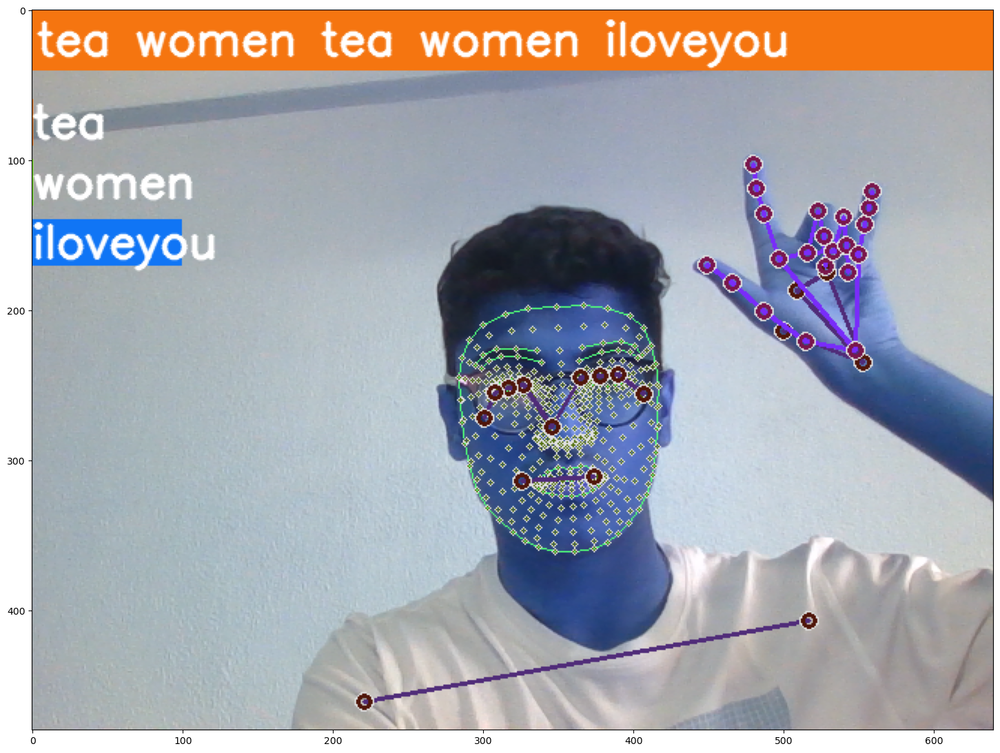

In [120]:
plt.figure(figsize=(18,18))
plt.imshow(prob_viz(res, actions, image, colors))

In [59]:
# 1. New detection variables
sequence = []
sentence = []
threshold = 0.8

cap = cv2.VideoCapture(0)
# Set mediapipe model 
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    while cap.isOpened():

        # Read feed
        ret, frame = cap.read()

        # Make detections
        image, results = mediapipe_detection(frame, holistic)
        print(results)
        
        # Draw landmarks
        draw_styled_landmarks(image, results)
        
        # 2. Prediction logic
        keypoints = extract_keypoints(results)
#         sequence.insert(0,keypoints)
#         sequence = sequence[:30]
        sequence.append(keypoints)
        sequence = sequence[-30:]
        
        if len(sequence) == 30:
            res = model.predict(np.expand_dims(sequence, axis=0))[0]
            print(actions[np.argmax(res)])
            
            
        #3. Viz logic
            if res[np.argmax(res)] > threshold: 
                if len(sentence) > 0: 
                    if actions[np.argmax(res)] != sentence[-1]:
                        sentence.append(actions[np.argmax(res)])
                else:
                    sentence.append(actions[np.argmax(res)])

            if len(sentence) > 5: 
                sentence = sentence[-5:]

            # Viz probabilities
            image = prob_viz(res, actions, image, colors)
            
        cv2.rectangle(image, (0,0), (640, 40), (245, 117, 16), -1)
        cv2.putText(image, ' '.join(sentence), (3,30), 
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
        
        # Show to screen
        cv2.imshow('OpenCV Feed', image)

        # Break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    cap.release()
    cv2.destroyAllWindows() #can you see???

<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.soluti

1/1 [==============================] - 0s 16ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 31ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 26ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 27ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 20ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 20ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
wome

1/1 [==============================] - 0s 20ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 22ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 16ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 16ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 26ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 28ms/step
tea
<class 'mediapipe.python.solution_base.S

1/1 [==============================] - 0s 36ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 41ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 31ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 39ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 40ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 31ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 47ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 32ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 32ms/step
tea
<class 'mediapipe.python.solution_base.S

1/1 [==============================] - 0s 32ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 33ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 31ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 33ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 33ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 29ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 32ms/step
tea
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 33ms/step
tea
<class 'mediapipe.python.solution_base.S

In [110]:
cap.release()
cv2.destroyAllWindows()

###  Test Cell

In [1]:
import cv2
import numpy as np  #numpy 1.24.3
import os
from matplotlib import pyplot as plt  # matplotlib 3.8.0
import time
import mediapipe as mp # mediapipe 0.10.7
import tensorflow as tf # tensorflow 2.13.0
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image

mp_holistic = mp.solutions.holistic # Holistic model
mp_drawing = mp.solutions.drawing_utils # Drawing utilities

def mediapipe_detection(image, model):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # COLOR CONVERSION BGR 2 RGB
    image.flags.writeable = False                  # Image is no longer writeable
    results = model.process(image)                 # Make prediction
    image.flags.writeable = True                   # Image is now writeable 
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # COLOR COVERSION RGB 2 BGR
    return image, results 

def draw_styled_landmarks(image, results):
    # Draw face connections
#     mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACEMESH_CONTOURS, 
#                              mp_drawing.DrawingSpec(color=(80,110,10), thickness=1, circle_radius=1), 
#                              mp_drawing.DrawingSpec(color=(80,256,121), thickness=1, circle_radius=1)
#                              ) 
    # Draw pose connections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS,
                             mp_drawing.DrawingSpec(color=(80,22,10), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(80,44,121), thickness=2, circle_radius=2)
                             ) 
    # Draw left hand connections
    mp_drawing.draw_landmarks(image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS, 
                             mp_drawing.DrawingSpec(color=(121,22,76), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(121,44,250), thickness=2, circle_radius=2)
                             ) 
    # Draw right hand connections  
    mp_drawing.draw_landmarks(image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS, 
                             mp_drawing.DrawingSpec(color=(245,117,66), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(245,66,230), thickness=2, circle_radius=2)
                             ) 
    
def extract_keypoints(results):
    pose = np.array([[res.x, res.y, res.z, res.visibility] for res in results.pose_landmarks.landmark]).flatten() if results.pose_landmarks else np.zeros(33*4)
    lh = np.array([[res.x, res.y, res.z] for res in results.left_hand_landmarks.landmark]).flatten() if results.left_hand_landmarks else np.zeros(21*3) 
    rh = np.array([[res.x, res.y, res.z] for res in results.right_hand_landmarks.landmark]).flatten() if results.right_hand_landmarks else np.zeros(21*3) 
    #face = np.array([[res.x, res.y, res.z] for res in results.face_landmarks.landmark]).flatten() if results.face_landmarks else np.zeros(468*3)
    return np.concatenate([pose, lh, rh])

# Path for exported data, numpy arrays
DATA_PATH = os.path.join('MP_Data')  #change

# Actions that we try to detect
actions = np.array(['tea', 'women', 'iloveyou'])
# actions = np.array(['How are you', 'Thank you', 'iloveyou'])

# Thirty videos worth of data
no_sequences = 30

# Videos are going to be 30 frames in length
sequence_length = 30

'''
so here bascially we arent just recognizing an action from a single frame,
we are recongixing action over a period of 30 frame and as calculates above,
each frame is an array of 1662 keypoints
'''



'\nso here bascially we arent just recognizing an action from a single frame,\nwe are recongixing action over a period of 30 frame and as calculates above,\neach frame is an array of 1662 keypoints\n'

In [4]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

label_map = {label: num for num, label in enumerate(actions)} 

sequences, labels = [], []
for action in actions:
    for sequence in range(no_sequences):
        window = []
        for frame_num in range(sequence_length):
            res = np.load(os.path.join(DATA_PATH, action, str(sequence), "{}.npy".format(frame_num)))
            window.append(res)
        sequences.append(window)
        labels.append(label_map[action])
    

In [5]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import TensorBoard

log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

model = Sequential()
model.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(30,258)))
model.add(LSTM(128, return_sequences=True, activation='relu'))
model.add(LSTM(64, return_sequences=False, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(actions.shape[0], activation='softmax'))

model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['categorical_accuracy'])

model.load_weights('my_model_today.h5') #dont run  run In[99] and In[102] before

In [10]:
colors = [(245,117,16), (117,245,16), (16,117,245), (128, 0, 128)]

def prob_viz(res, actions, input_frame, colors):
    output_frame = input_frame.copy()
    for num, prob in enumerate(res):
        cv2.rectangle(output_frame, (0,60+num*40), (int(prob*100), 90+num*40), colors[num], -1)
        cv2.putText(output_frame, actions[num], (0, 85+num*40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
        
    return output_frame

###
face_classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml') # enter ur file path yaha pe
classifier = load_model('face_model.h5', compile=False) # enter ur file path yaha pe

emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Neutral', 'Sad', 'Surprise']
###

# 1. New detection variables
sequence = []
sentence = []
threshold = 0.8

cap = cv2.VideoCapture(0)
# Set mediapipe model 
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    while cap.isOpened():
        
        ret, frame = cap.read() #done
        labels_face = []
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = face_classifier.detectMultiScale(gray)
        
        for (x, y, w, h) in faces:
            cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)
            roi_gray = gray[y:y+h, x:x+w]
            roi_gray = cv2.resize(roi_gray, (48, 48), interpolation=cv2.INTER_AREA)

            if np.sum([roi_gray]) != 0:
                roi = roi_gray.astype('float') / 255.0
                roi = img_to_array(roi)
                roi = np.expand_dims(roi, axis=0)

                prediction = classifier.predict(roi)[0]
                label = emotion_labels[prediction.argmax()]
                label_position = (x, y)
                cv2.putText(frame, label, label_position, cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
            else:
                cv2.putText(frame, 'No Faces', (30, 80), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        
        ####

        # Read feed
#         ret, frame = cap.read()

        # Make detections
        image, results = mediapipe_detection(frame, holistic)
        print(results)
        
        # Draw landmarks
        draw_styled_landmarks(image, results)
        
        # 2. Prediction logic
        keypoints = extract_keypoints(results)
#         sequence.insert(0,keypoints)
#         sequence = sequence[:30]
        sequence.append(keypoints)
        sequence = sequence[-30:]
        
        if len(sequence) == 30:
            res = model.predict(np.expand_dims(sequence, axis=0))[0]
            print(actions[np.argmax(res)])
            
                ###
            for (x, y, w, h) in faces:
                cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)
                roi_gray = gray[y:y+h, x:x+w]
                roi_gray = cv2.resize(roi_gray, (48, 48), interpolation=cv2.INTER_AREA)

                if np.sum([roi_gray]) != 0:
                    roi = roi_gray.astype('float') / 255.0
                    roi = img_to_array(roi)
                    roi = np.expand_dims(roi, axis=0)

                    prediction = classifier.predict(roi)[0]
                    label = emotion_labels[prediction.argmax()]
                    label_position = (x, y)
                    cv2.putText(frame, label, label_position, cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
                else:
                    cv2.putText(frame, 'No Faces', (30, 80), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        
        ###
            
        #3. Viz logic
            if res[np.argmax(res)] > threshold: 
                if len(sentence) > 0: 
                    if actions[np.argmax(res)] != sentence[-1]:
                        sentence.append(actions[np.argmax(res)])
                else:
                    sentence.append(actions[np.argmax(res)])

            if len(sentence) > 5: 
                sentence = sentence[-5:]

            # Viz probabilities
            image = prob_viz(res, actions, image, colors)
            
        cv2.rectangle(image, (0,0), (640, 40), (245, 117, 16), -1)
        cv2.putText(image, ' '.join(sentence), (3,30), 
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
        
        
        # Show to screen
        cv2.imshow('OpenCV Feed', image)

        # Break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    cap.release()
    cv2.destroyAllWindows() #can you see???

1/1 [==============================] - 0s 273ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 28ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 27ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 31ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 27ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 29ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 26ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 25ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 28ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [=============

1/1 [==============================] - 0s 27ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 25ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 25ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 26ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 26ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 25ms/step
ilov

1/1 [==============================] - 0s 22ms/step
iloveyou
1/1 [==============================] - 0s 24ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 21ms/step
iloveyou
1/1 [==============================] - 0s 25ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 22ms/step
iloveyou
1/1 [==============================] - 0s 25ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 22ms/step
iloveyou
1/1 [==============================] - 0s 25ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 22ms/step
iloveyou
1/1 [==============================] - 0s 26ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 21ms/step
iloveyou
1/1 [==============================] - 0s 24ms/step
<class 'mediapipe.python.solution_bas

1/1 [==============================] - 0s 25ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 21ms/step
iloveyou
1/1 [==============================] - 0s 27ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 21ms/step
iloveyou
1/1 [==============================] - 0s 25ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 23ms/step
iloveyou
1/1 [==============================] - 0s 25ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 20ms/step
iloveyou
1/1 [==============================] - 0s 25ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 20ms/step
iloveyou
1/1 [==============================] - 0s 27ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s

1/1 [==============================] - 0s 31ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 27ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 25ms/step
iloveyou
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 24ms/step
iloveyou
1/1 [==============================] - 0s 29ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 23ms/step
iloveyou
1/1 [==============================] - 0s 27ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [==============================] - 0s 21ms/step
iloveyou
1/1 [==============================] - 0s 27ms/step
<class 'mediapipe.python.solution_base.SolutionOutputs'>
1/1 [======================